# Caption-conditioned Generation
Use BLIP-2 captions as text prompts to generate images with FLUX.1-dev + IP-Adapter (text-only conditioning).
Plot generated images side-by-side with the original stimuli.

In [1]:
import sys
import json
import numpy as np

import torch
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm

sys.path.insert(0, '.')

from config_const import (
    CHECKPOINT_DIR, BLIP2_CAPTIONS_PATH, BLIP2_DETAILED_CAPTIONS_PATH,
    RUST_STIM_DIR, N_STIMULI, N_TRAIN, N_VAL, SEED,
)
from generation.flux_ipadapter import load_pipeline, generate
from generation.conditioning import text_only
from get_device import get_device

## 1. Load captions and original stimuli

In [2]:
with open(BLIP2_CAPTIONS_PATH) as f:
    captions = {int(k): v for k, v in json.load(f).items()}

with open(BLIP2_DETAILED_CAPTIONS_PATH) as f:
    detailed_captions = {int(k): v for k, v in json.load(f).items()}

print(f"Captions loaded: {len(captions)} short, {len(detailed_captions)} detailed")
for i in range(3):
    print(f"  [{i:03d}] {captions[i]}")
    print(f"        {detailed_captions[i]}")

Captions loaded: 300 short, 300 detailed
  [000] a color photograph of a mailbox on the side walk
        a color photograph of a mailbox on the side walk next to some houses and trees in black and white. there is also an envelope with mail inside it sitting beside one of them as well, which has been placed into another box that looks like its from the same company or something similar looking at this angle through my window right now
  [001] a color photograph of a sign that says t
        a color photograph of a sign that says t in black and white on it's side. the photo is taken from above with no reflection or light source behind it to make this image look like an actual picture, but instead just looks like something you would see if someone took one at night while walking around town looking for street signs
  [002] a color photograph of a bottle with pills on it
        a color photograph of a bottle with pills on it in black and white, next to some other items that are also show

In [3]:
# Reproduce the same train/val/test split used in rust_loader
rng  = np.random.default_rng(SEED)
perm = rng.permutation(N_STIMULI)
train_idx = perm[:N_TRAIN].tolist()
val_idx   = perm[N_TRAIN : N_TRAIN + N_VAL].tolist()
test_idx  = perm[N_TRAIN + N_VAL :].tolist()

eval_idx   = val_idx
split_name = "val"
print(f"train: {len(train_idx)}  val: {len(val_idx)}  test: {len(test_idx)}")


train: 200  val: 50  test: 50


In [4]:
def load_stimulus(stim_idx: int) -> Image.Image:
    return Image.open(RUST_STIM_DIR / f"{stim_idx:04d}.png").convert("RGB")

# Pre-load originals for the eval split
originals = {i: load_stimulus(i) for i in tqdm(eval_idx, desc="Loading stimuli")}

Loading stimuli:   0%|          | 0/50 [00:00<?, ?it/s]

Loading stimuli: 100%|██████████| 50/50 [00:00<00:00, 383.47it/s]


## 2. Load FLUX + IP-Adapter

In [5]:
pipe, ip_adapter = None, None
torch.cuda.empty_cache()
device = get_device()

PATCH_GRID = 14  # must match the run you're loading
pipe, ip_adapter = load_pipeline(
    device=device,
    patch_grid=PATCH_GRID,
    ip_adapter_checkpoint=str(
        CHECKPOINT_DIR
        / f"ip_adapter_img2img/patch{PATCH_GRID}_lr0.001_wd0.0001_size512_embsiglip_s0.3-0.5-0.8/best.pt"
    ),
)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/219 [00:00<?, ?it/s]

Loaded IP-Adapter from /home/yy3658/NeurObjectGen/checkpoints/ip_adapter_img2img/patch14_lr0.001_wd0.0001_size512_embsiglip_s0.3-0.5-0.8/best.pt


## 3. Generate — short captions (text-only)

In [6]:
N_SHOW = 10  # number of examples to generate and display

# images_short = []
# for stim_idx in tqdm(eval_idx[:N_SHOW], desc="Generating (short captions)"):
#     img = generate(
#         pipe, ip_adapter,
#         show_progress=False,
#         **text_only(captions[stim_idx]),
#     )
#     images_short.append((stim_idx, img))

In [7]:
ncols = 5  # pairs per row: original | generated
nrows = (N_SHOW + ncols - 1) // ncols

# fig, axes = plt.subplots(nrows * 2, ncols, figsize=(ncols * 3, nrows * 6))
# for ax in axes.flat:
#     ax.axis("off")

# for col, (stim_idx, gen_img) in enumerate(images_short):
#     row_block = (col // ncols) * 2
#     col_pos   = col % ncols
#     # top row: original
#     axes[row_block,     col_pos].imshow(originals[stim_idx])
#     axes[row_block,     col_pos].set_title(f"orig {stim_idx}", fontsize=7)
#     # bottom row: generated
#     axes[row_block + 1, col_pos].imshow(gen_img)
#     axes[row_block + 1, col_pos].set_title(
#         captions[stim_idx][:40] + ("…" if len(captions[stim_idx]) > 40 else ""),
#         fontsize=6,
#     )

# plt.suptitle(f"Caption-only generation — {split_name} set (short captions)", fontsize=11)
# plt.tight_layout()
# plt.show()

## 4. Generate — detailed captions (text-only)

In [8]:
# images_detailed = []
# for stim_idx in tqdm(eval_idx[:N_SHOW], desc="Generating (detailed captions)"):
#     img = generate(
#         pipe, ip_adapter,
#         show_progress=False,
#         **text_only(detailed_captions[stim_idx]),
#     )
#     images_detailed.append((stim_idx, img))

In [9]:
# fig, axes = plt.subplots(nrows * 2, ncols, figsize=(ncols * 3, nrows * 6))
# for ax in axes.flat:
#     ax.axis("off")

# for col, (stim_idx, gen_img) in enumerate(images_detailed):
#     row_block = (col // ncols) * 2
#     col_pos   = col % ncols
#     axes[row_block,     col_pos].imshow(originals[stim_idx])
#     axes[row_block,     col_pos].set_title(f"orig {stim_idx}", fontsize=7)
#     axes[row_block + 1, col_pos].imshow(gen_img)
#     axes[row_block + 1, col_pos].set_title(
#         detailed_captions[stim_idx][:40] + ("…" if len(detailed_captions[stim_idx]) > 40 else ""),
#         fontsize=6,
#     )

# plt.suptitle(f"Caption-only generation — {split_name} set (detailed captions)", fontsize=11)
# plt.tight_layout()
# plt.show()

## 5. img2img — init from stimulus latent, denoise with IP-Adapter

Encode the stimulus with the VAE, add noise up to `strength`, then run the
denoising loop conditioned on the neural embedding via IP-Adapter.
Lower `strength` stays closer to the original; higher `strength` gives the
model more freedom to diverge.

In [10]:
from generation.flux_ipadapter import _encode_image, decode_latent, generate_img2img
from config_const import (
    SIGLIP_DIM,
    SIGLIP_PATCH8_PATH,
    SIGLIP_PATCH14_PATH,
)

# Load the patch SigLIP cache matching the loaded checkpoint.
patch_cache_path = SIGLIP_PATCH14_PATH if PATCH_GRID == 14 else SIGLIP_PATCH8_PATH
siglip_all = torch.load(patch_cache_path, weights_only=True)  # (300, K, 1152)
N_PATCH_TOKENS = siglip_all.shape[1]
print(f"SigLIP patch embeddings: {siglip_all.shape}")

# Index by split stimulus indices to get per-split embedding tensors
embeds_train = siglip_all[train_idx[:N_SHOW]]
embeds_val   = siglip_all[val_idx]
embeds_test  = siglip_all[test_idx]
print(f"train: {embeds_train.shape}  val: {embeds_val.shape}  test: {embeds_test.shape}")

SigLIP patch embeddings: torch.Size([300, 196, 1152])
train: torch.Size([10, 196, 1152])  val: torch.Size([50, 196, 1152])  test: torch.Size([50, 196, 1152])


In [15]:
STRENGTH = 0.8  # 0 = pure VAE round-trip, 1 = generate from noise

NULL_PATCH_EMBED = torch.zeros(N_PATCH_TOKENS, SIGLIP_DIM)

def run_img2img(indices, embeds, label):
    results = []
    for i, stim_idx in enumerate(tqdm(indices[:N_SHOW], desc=f"img2img {label}")):
        orig_512 = load_stimulus(stim_idx).resize((512, 512), Image.LANCZOS)
        guided = generate_img2img(
            pipe, ip_adapter,
            init_image=orig_512,
            image_embedding=embeds[i],
            strength=STRENGTH,
            seed=i,
            show_progress=False,
        )
        control = generate_img2img(
            pipe, ip_adapter,
            init_image=orig_512,
            image_embedding=NULL_PATCH_EMBED,
            ip_adapter_scale=0.0,
            strength=STRENGTH,
            seed=i,
            show_progress=False,
        )
        results.append((stim_idx, orig_512, guided, control))
    return results

def plot_img2img(results, label):
    # Layout: 6 columns = 2 stimuli x [orig | neural | control]
    # Each stimulus occupies 3 consecutive columns.
    STIM_PER_ROW = 2
    COLS_PER_STIM = 3          # orig, neural, control
    ncols = STIM_PER_ROW * COLS_PER_STIM  # = 6
    n  = len(results)
    nr = (n + STIM_PER_ROW - 1) // STIM_PER_ROW

    fig, axes = plt.subplots(nr, ncols, figsize=(ncols * 3, nr * 3))
    if nr == 1:
        axes = axes[None, :]   # ensure 2-d
    for ax in axes.flat:
        ax.axis('off')

    for idx, (stim_idx, orig, guided, control) in enumerate(results):
        row = idx // STIM_PER_ROW
        base_col = (idx % STIM_PER_ROW) * COLS_PER_STIM
        axes[row, base_col    ].imshow(orig);    axes[row, base_col    ].set_title(f'orig {stim_idx}', fontsize=7)
        axes[row, base_col + 1].imshow(guided);  axes[row, base_col + 1].set_title('neural', fontsize=7)
        axes[row, base_col + 2].imshow(control); axes[row, base_col + 2].set_title('control', fontsize=7)

    plt.suptitle(f'img2img — {label}  strength={STRENGTH}', fontsize=11)
    plt.tight_layout()
    plt.show()

# res_train = run_img2img(train_idx, embeds_train, 'train')
# plot_img2img(res_train, 'train set')

# res_val = run_img2img(val_idx, embeds_val, 'val')
# plot_img2img(res_val, 'val set')

# res_test = run_img2img(test_idx, embeds_test, 'test')
# plot_img2img(res_test, 'test set')

## 6. img2img — caption prompt, no IP-Adapter

Bypass the image-embedding pathway (`ip_adapter_scale=0.0`) and rely on the BLIP-2 caption as the only conditioning signal. This is the text-only img2img baseline — how well does denoising from a partially-noised stimulus recover structure when guided by a language description alone?

img2img caption val (short):   0%|          | 0/10 [00:00<?, ?it/s]

img2img caption val (short): 100%|██████████| 10/10 [01:58<00:00, 11.86s/it]


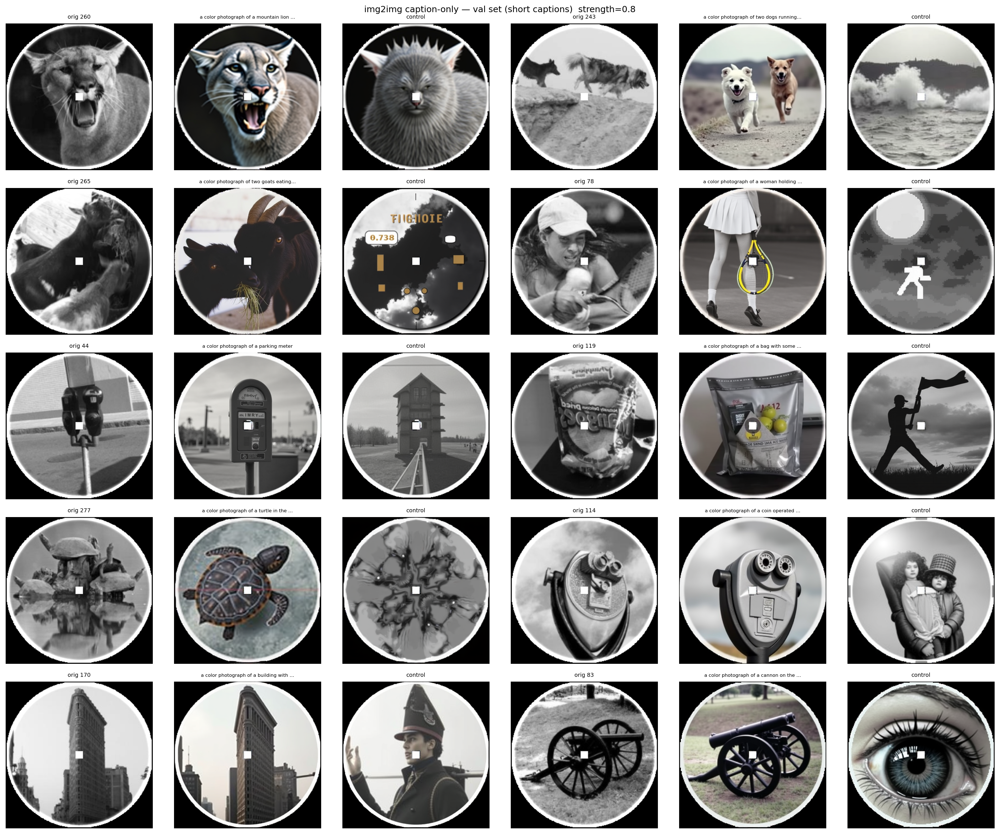

img2img caption val (detailed): 100%|██████████| 10/10 [01:59<00:00, 11.91s/it]


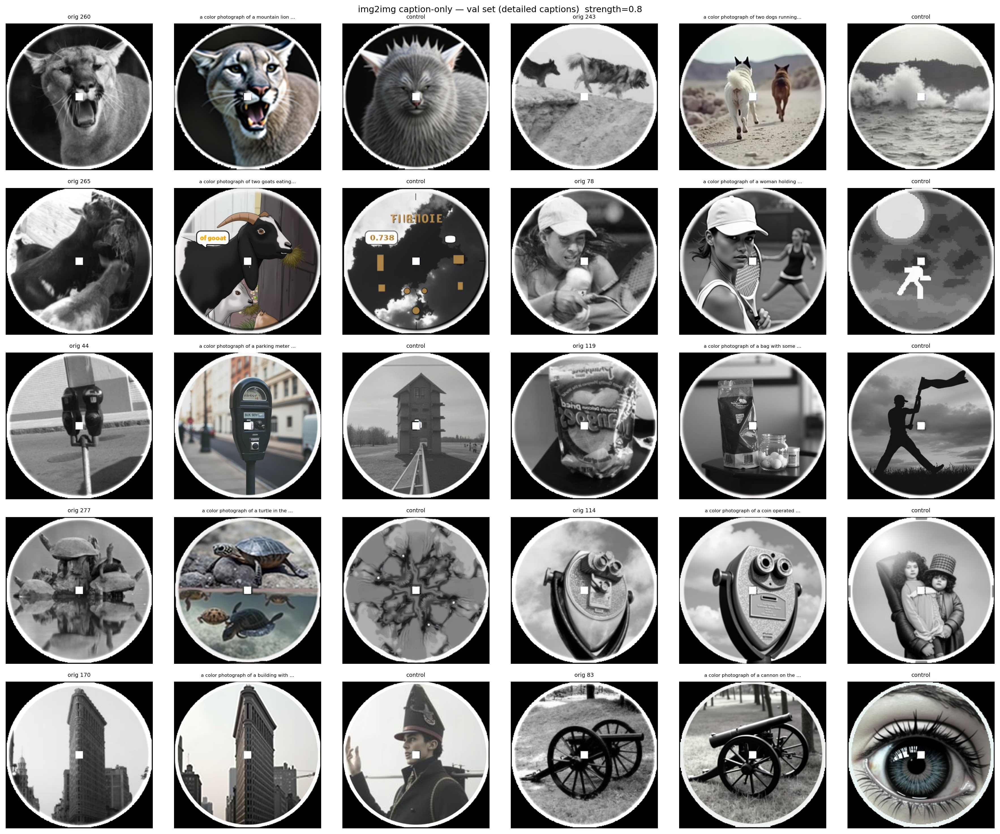

In [16]:
def run_img2img_caption(indices, caption_dict, label, strength=STRENGTH):
    results = []
    for i, stim_idx in enumerate(tqdm(indices[:N_SHOW], desc=f"img2img caption {label}")):
        orig_512 = load_stimulus(stim_idx).resize((512, 512), Image.LANCZOS)
        caption = caption_dict[stim_idx]
        guided = generate_img2img(
            pipe, ip_adapter,
            init_image=orig_512,
            image_embedding=NULL_PATCH_EMBED,
            ip_adapter_scale=0.0,
            prompt=caption,
            strength=strength,
            seed=i,
            show_progress=False,
        )
        control = generate_img2img(
            pipe, ip_adapter,
            init_image=orig_512,
            image_embedding=NULL_PATCH_EMBED,
            ip_adapter_scale=0.0,
            strength=strength,
            seed=i,
            show_progress=False,
        )
        results.append((stim_idx, orig_512, guided, control, caption))
    return results


def plot_img2img_caption(results, label):
    STIM_PER_ROW = 2
    COLS_PER_STIM = 3
    ncols = STIM_PER_ROW * COLS_PER_STIM
    n = len(results)
    nr = (n + STIM_PER_ROW - 1) // STIM_PER_ROW

    fig, axes = plt.subplots(nr, ncols, figsize=(ncols * 3, nr * 3))
    if nr == 1:
        axes = axes[None, :]
    for ax in axes.flat:
        ax.axis("off")

    for idx, (stim_idx, orig, guided, control, caption) in enumerate(results):
        row = idx // STIM_PER_ROW
        base_col = (idx % STIM_PER_ROW) * COLS_PER_STIM
        axes[row, base_col    ].imshow(orig);    axes[row, base_col    ].set_title(f"orig {stim_idx}", fontsize=7)
        axes[row, base_col + 1].imshow(guided);  axes[row, base_col + 1].set_title(
            caption[:38] + ("…" if len(caption) > 38 else ""), fontsize=6,
        )
        axes[row, base_col + 2].imshow(control); axes[row, base_col + 2].set_title("control", fontsize=7)

    plt.suptitle(f"img2img caption-only — {label}  strength={STRENGTH}", fontsize=11)
    plt.tight_layout()
    plt.show()


# Short captions
res_cap_val = run_img2img_caption(val_idx, captions, "val (short)")
plot_img2img_caption(res_cap_val, "val set (short captions)")

# Detailed captions
res_cap_val_det = run_img2img_caption(val_idx, detailed_captions, "val (detailed)")
plot_img2img_caption(res_cap_val_det, "val set (detailed captions)")
